In [6]:
import requests
import requests
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from   matplotlib import colors

attempts = requests.get('https://raw.githubusercontent.com/arcprizeorg/model_baseline/refs/heads/main/results/open_ai_o3_high_20241220/attemps.json').json()
results = requests.get('https://raw.githubusercontent.com/arcprizeorg/model_baseline/refs/heads/main/results/open_ai_o3_high_20241220/results.json').json()

In [7]:
def show_arc(arc_id, c='train'):
  a4c177718 = requests.get('https://raw.githubusercontent.com/fchollet/ARC-AGI/aa922be204204ec148a1137fe6ed4d34ddde812b/data/evaluation/'+arc_id+'.json').json()

  a4c177718[c] = a4c177718[c] + a4c177718['test']

  testing_data = a4c177718['test']

  att = attempts[arc_id]

  if att[0]['attempt_2']!=None:
    a4c177718[c] = a4c177718[c] + [{"input" : att[0]['attempt_1'], "output" : att[0]['attempt_2']}]
    a4c177718[c] = a4c177718[c] + [{"input" : att[0]['attempt_1'], 'output' : testing_data[0]['output']}]
    a4c177718[c] = a4c177718[c] + [{"input" : att[0]['attempt_2'], 'output' : testing_data[0]['output']}]
    a4c177718[c] = a4c177718[c] + [{"input" : testing_data[0]['input'], 'output' : att[0]['attempt_1'] }]
    a4c177718[c] = a4c177718[c] + [{"input" : testing_data[0]['input'], 'output' : att[0]['attempt_2'] }]
  else:
    a4c177718[c] = a4c177718[c] + [{"input" : att[0]['attempt_1'], "output" : att[0]['attempt_1']}]

  n = len(a4c177718[c])

  #fig, axes = plt.subplots(n, 4, figsize=(18, 18))
  #fig.suptitle("#"+arc_id)

  fig = plt.figure(constrained_layout=True, figsize=(16, 26))
  fig.suptitle('ARC-AGI Informatin Entropy Analysis, o3 attempts published on Dec 20, 2024\n#'+arc_id)

  # create 3x1 subfigs
  subfigs = fig.subfigures(nrows=n, ncols=1)

  # Define the colormap and normalize it for consistency
  # Thanks for the colormap: https://www.kaggle.com/code/allegich/arc-2024-show-all-400-training-tasks
  cmap = colors.ListedColormap(
    ['#000000', '#0074D9', '#FF4136', '#2ECC40', '#FFDC00',
     '#AAAAAA', '#F012BE', '#FF851B', '#7FDBFF', '#870C25'])
  norm = colors.Normalize(vmin=0, vmax=9)
  print("#"+arc_id)
  answer = None
  answer_2 = None
  answer_3 = None
  for i in range(n):
      subfig = subfigs[i]

      d = a4c177718[c][i]

      d_input = d['input']
      d_output = d['output']
      plot_target = False
      capture_answer = False

      subfig.suptitle(f'Compare example {i+1} input and output', ha='left')

      k = "examples"
      k_left = "examples"
      k_right = "examples"

      # Query and Answer
      if i == (n-6):
        k = "query"
        k_left = "query"
        k_right = "answer"
        print("query")
        print(i, k)
        subfig.suptitle(f'Compare query and answer (Ground Truth, Expected Answer)', ha='left')
        subfig.set_facecolor('xkcd:salmon')
        capture_answer = True

      if i == (n-5):
        k = "attempts"
        k_left = "attempt_1"
        k_right = "attempt_2"
        print("attempts")
        print(i, k)
        subfig.suptitle(f'Compare attempt_1 and attempt_2 (Self-Consistency)', horizontalalignment='left')

      if i == (n-4):
        k = "attempts"
        k_left = "attempt_1"
        k_right = "answer"
        print("attempts")
        print(i, k)
        subfig.suptitle(f'Compare attempt_1 and answer (Precision)', horizontalalignment='left')

      if i == (n-3):
        k = "attempts"
        k_left = "attempt_2"
        k_right = "answer"
        print("attempts")
        print(i, k)
        subfig.suptitle(f'Compare attempt_2 and answer (Precision)', horizontalalignment='left')


      if i == (n-2):
        k = "attempts"
        k_left = "query"
        k_right = "attempt_1"
        print("attempts")
        print(i, k)
        subfig.suptitle(f'Compare query and attempt_1 (Recall)', horizontalalignment='left')
        plot_target = True


      if i == (n-1):
        k = "attempts"
        k_left = "query"
        k_right = "attempt_2"
        print("attempts")
        print(i, k)
        subfig.suptitle(f'Compare query and attempt_2 (Recall)', horizontalalignment='left')
        plot_target = True

      # create 1x3 subplots per subfig
      axes = subfig.subplots(nrows=1, ncols=4)

      # Input heatmap
      sns.heatmap(d_input, cmap=cmap, norm=norm, linewidths=0.5, linecolor='white',
                  square=True, cbar=False, ax=axes[0], annot=True, fmt=".0f", annot_kws={"size": 8})
      axes[0].set_title(f"Input {i+1} " + k_left + " " + str(np.array(d_input).shape), fontsize=9)
      axes[0].set_xticks([])
      axes[0].set_yticks([])


      for t in axes[0].texts:
          if int(t.get_text()) == 0:
              t.set_text("")

      # Output heatmap
      sns.heatmap(d_output, cmap=cmap, norm=norm, linewidths=0.5,
                  linecolor='white', square=True, cbar=False, ax=axes[1],
                  annot=True, fmt=".0f", annot_kws={"size": 8})
      axes[1].set_title(f"Output {i+1} " + k_right + " " + str(np.array(d_output).shape), fontsize=9)
      axes[1].set_xticks([])
      axes[1].set_yticks([])

      for t in axes[1].texts:
          if int(t.get_text()) == 0:
              t.set_text("")

      #H1 = [word_entropy(str(list(str(d['input']))[:i])) for i in range(1, 1 + len(list(str(d['input']))))]
      #v1 = [ np.var(H[:i]) for i in range(1, len(H) + 1)]

      a = " ".join([" ".join([str(c) for c in r]) for r in d_input ])
      H1 = [word_entropy(a[:i]) for i in range(1, 1 + len(a))]

      a = " ".join([" ".join([str(c) for c in r]) for r in d_output ])
      H2 = [word_entropy(a[:i]) for i in range(1, 1 + len(a))]

      if capture_answer:
        print("Captured answer", H2, i)
        answer = H2

      # Input output cross overs
      z = list(zip(np.array(d_input).reshape(-1), np.array(d_output).reshape(-1)))
      z = " ".join([str(x[0])+" "+str(x[1]) for x in z])
      H3 = [word_entropy(z[:i]) for i in range(1, 1 + len(z))]

      aa = np.array(d_input)
      aa2 = np.array(d_output)

      # Rotate the array 90 degrees clockwise
      rotated_aa = np.rot90(aa, k=1)  # k=1 for 90 degrees clockwise
      rotated_aa2 = np.rot90(aa2, k=1)

      z2 = list(zip(rotated_aa.reshape(-1), rotated_aa2.reshape(-1)))

      z2 = " ".join([str(x[0])+" "+str(x[1]) for x in z2])
      H4 = [word_entropy(z2[:i]) for i in range(1, 1 + len(z2))]

      if capture_answer:
        answer_2 = H3
        answer_3 = H4

      sns.lineplot(normalize(H1), ax=axes[2], label='Input')
      sns.lineplot(normalize(H2), ax=axes[2], label='Output')
      if plot_target:
        sns.lineplot(normalize(answer), ax=axes[2], label='Target')
      axes[2].set_title("H: accumulated per cell "+k, fontsize=9)
      axes[2].legend(fontsize=8)

      sns.lineplot(normalize(H3), ax=axes[3], label='In+Out Pairs (row)')
      sns.lineplot(normalize(H4), ax=axes[3], label='In+Out Pairs (rot90)')

      if plot_target:
        sns.lineplot(normalize(answer_2), ax=axes[3], label='Target (row)')
        sns.lineplot(normalize(answer_3), ax=axes[3], label='Target (rot90)')

      axes[3].set_title("H: In + Out Pairs "+k, fontsize=9)
      axes[3].legend(fontsize=8)

  plt.tight_layout()
  plt.show()

In [8]:
from collections import Counter
from scipy.stats import entropy

def normalize(values):
    min_val = min(values)
    max_val = max(values)
    if min_val==max_val:
      return [1 for x in values]
    else:
      return [np.log((x - min_val) / (max_val - min_val)) for x in values]

def word_probability(message):
    words = message.split()  # Split the message into words
    word_counts = Counter(words)
    total_words = sum(word_counts.values())
    probabilities = {word: count / total_words for word, count in word_counts.items()}
    return probabilities

# Function to compute entropy of a message based on words
def word_entropy(message):
    probs = np.array(list(word_probability(message).values()))
    return entropy(probs, base=2)  # Using base 2 to get entropy in bits

#da515329


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

query
3 query
Captured answer [0.0, 0.0, 1.0, 1.0, 0.9182958340544894, 0.9182958340544894, 0.8112781244591328, 0.8112781244591328, 0.7219280948873623, 0.7219280948873623, 0.6500224216483541, 0.6500224216483541, 0.5916727785823274, 0.5916727785823274, 0.5435644431995964, 0.5435644431995964, 0.5032583347756457, 0.5032583347756457, 0.46899559358928117, 0.46899559358928117, 0.43949698692151334, 0.43949698692151334, 0.4138168503036338, 0.4138168503036338, 0.3912435636292556, 0.3912435636292556, 0.3712323266408757, 0.3712323266408757, 0.3533593350214213, 0.3533593350214213, 0.3372900666170139, 0.3372900666170139, 0.3227569588973983, 0.3227569588973983, 0.3095434291503252, 0.3095434291503252, 0.2974722489192897, 0.2974722489192897, 0.2863969571159562, 0.2863969571159562, 0.2761954276479391, 0.2761954276479391, 0.43949698692151334, 0.43949698692151334, 0.42622865699814483, 0.42622865699814483, 0.4138168503036338, 0.4138168503036338, 0.4021791902022729, 0.4021791902022729, 0.3912435636292556, 0

<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
4 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
5 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
6 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
7 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

attempts
8 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-7-aead591ba312>:199: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()
<ipython-input-7-aead591ba312>:199: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


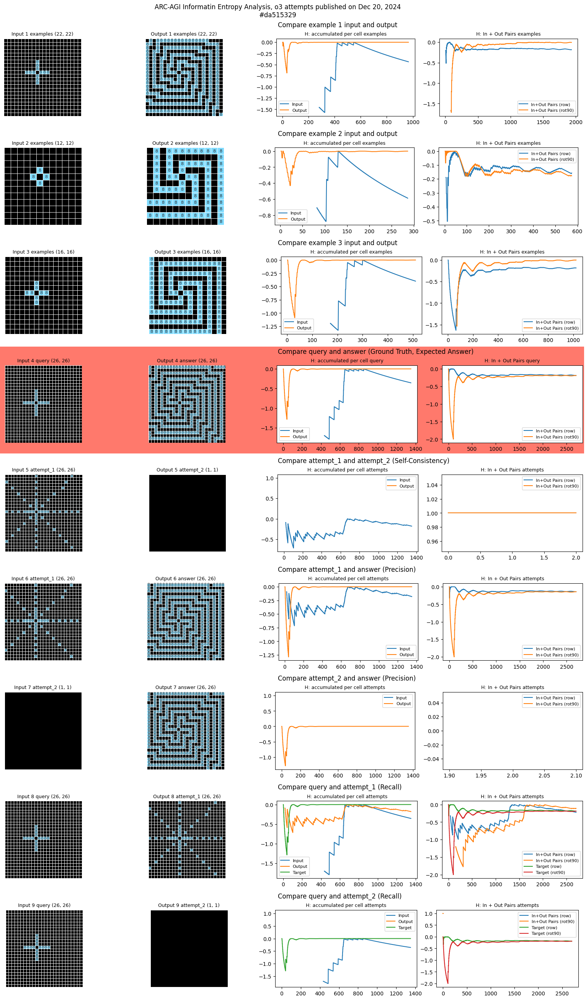

#f9d67f8b


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

query
4 query
Captured answer [0.0, 0.0, 1.0, 1.0, 0.9182958340544894, 0.9182958340544894, 0.8112781244591328, 0.8112781244591328, 1.370950594454669, 1.370950594454669, 1.7924812503605783, 1.7924812503605783, 1.8423709931771088, 1.8423709931771088, 2.1556390622295667, 2.1556390622295667, 2.1971597234241496, 2.1971597234241496, 2.246439344671016, 2.246439344671016, 2.299896391167891, 2.299896391167891, 2.522055208874201, 2.522055208874201, 2.7192945256669794, 2.7192945256669794, 2.6995138503199665, 2.6995138503199665, 2.6565647621309543, 2.6565647621309543, 2.7028195311147836, 2.7028195311147836, 2.704534899819343, 2.704534899819343, 2.66329080817766, 2.66329080817766, 2.615319618251277, 2.615319618251277, 2.6709505944546685, 2.6709505944546685, 2.665428731993503, 2.665428731993503, 2.6858157091530304, 2.6858157091530304, 2.707282064282346, 2.707282064282346, 2.729573958513622, 2.729573958513622, 2.7328786893420314, 2.7328786893420314, 2.7036648350297985, 2.7036648350297985, 2.711877892

<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
5 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
6 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
7 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
8 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

attempts
9 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

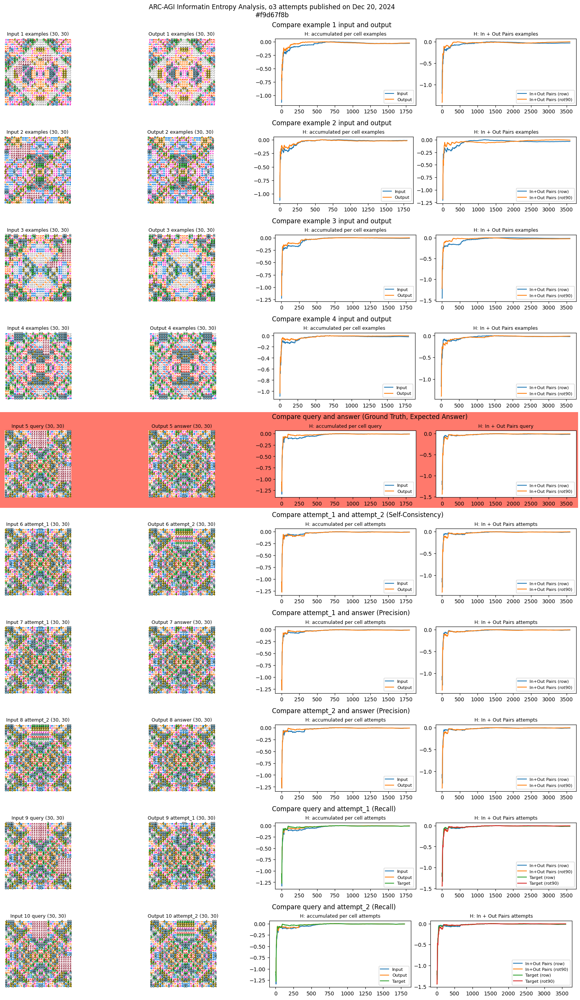

#891232d6


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

query
4 query
Captured answer [0.0, 0.0, 0.0, 0.0, 0.9182958340544894, 0.9182958340544894, 0.8112781244591328, 0.8112781244591328, 0.7219280948873623, 0.7219280948873623, 0.9182958340544894, 0.9182958340544894, 1.3787834934861756, 1.3787834934861756, 1.2987949406953987, 1.2987949406953987, 1.2243944454059863, 1.2243944454059863, 1.1567796494470395, 1.1567796494470395, 1.0957952550009338, 1.0957952550009338, 1.0408520829727552, 1.0408520829727552, 0.9912642605354288, 0.9912642605354288, 0.946372935985442, 0.946372935985442, 0.9055872616982602, 0.9055872616982602, 0.8683927290103626, 0.8683927290103626, 0.8343470230852539, 0.8343470230852539, 0.8030717273241025, 0.8030717273241025, 0.7742433029172697, 0.7742433029172697, 0.747584679824574, 0.747584679824574, 0.8569957178540347, 0.8569957178540347, 0.8315435491770657, 0.8315435491770657, 0.8076702057269437, 0.8076702057269437, 0.9405662399881732, 0.9405662399881732, 0.916118213778296, 0.916118213778296, 0.89299535735196, 0.89299535735196,

<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
5 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
6 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
7 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
8 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

attempts
9 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

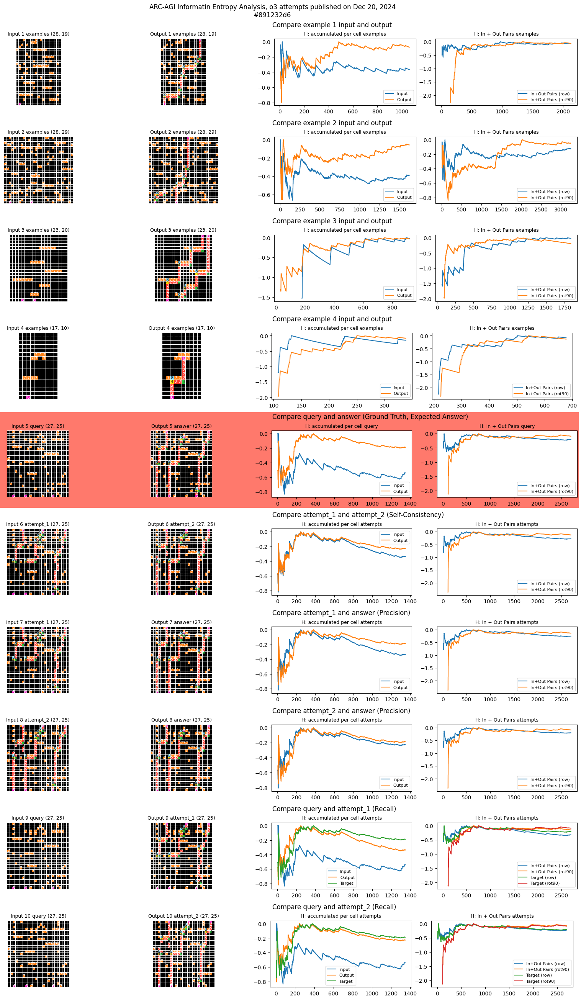

#52fd389e


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

query
3 query
Captured answer [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.19590927087360493, 0.19590927087360493, 0.3227569588973983, 0.3227569588973983, 0.42200051688315315, 0.42200051688315315, 0.5032583347756457, 0.5032583347756457, 0.5713549744279548, 0.5713549744279548, 0.6292492238560347, 0.6292492238560347, 0.6193821946787638, 0.6193821946787638, 0.6098403047164005, 0.6098403047164005, 0.6006085754131871, 0.6006085754131871, 0.5916727785823274, 0.5916727785823274, 0.5830194167347008, 0.5830194167347008, 0.5746356978376794, 0.5746356978376794, 0.5665095065529053, 0.5665095065529053, 0.7052910530145211, 0.7052910530145211, 0.7962811593381773, 0.7962811593381773, 0.8683927290103626, 0.8683927290103626, 0.928

<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
4 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
5 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
6 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
7 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

attempts
8 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

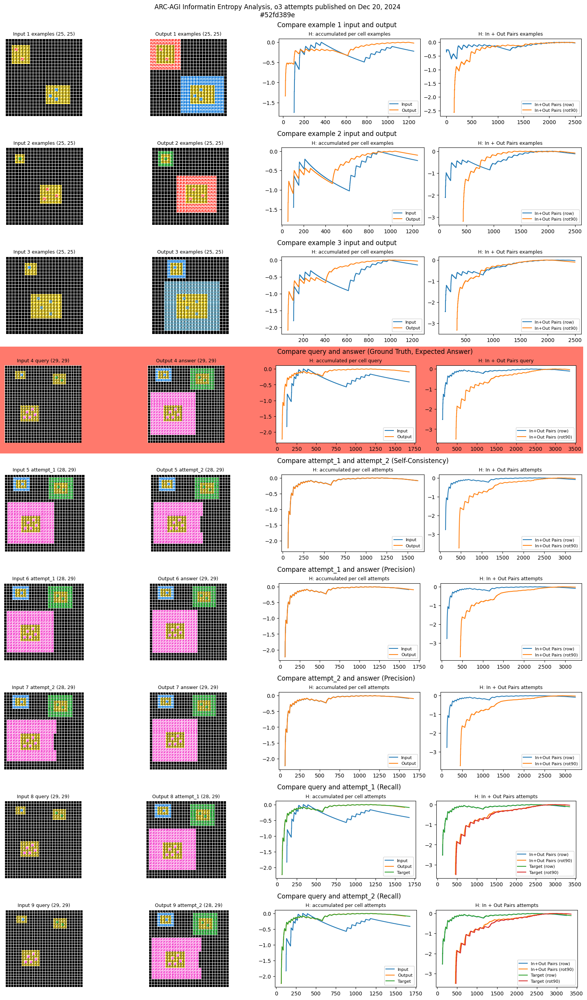

#c6e1b8da


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

query
3 query
Captured answer [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.26676498780302604, 0.26676498780302604, 0.42622865699814483, 0.42622865699814483, 0.5435644431995964, 0.5435644431995964, 0.6343095546405662, 0.6343095546405662, 0.7062740891876007, 0.7062740891876007, 0.7642045065086203, 0.7642045065086203, 0.74959525725948, 0.74959525725948, 0.7355085815538399, 0.7355085815538399, 0.7219280948873623, 0.7219280948873623, 0.7088356733321961, 0.7088356733321961, 0.6962122601251458, 0.6962122601251458, 0.6840384356390417, 0.6840384356390417, 0.672294817075638, 0.672294817075638, 0.6609623351442084, 0.6609623351442084, 0.6500224216483541, 0.6500224216483541, 0.6394571324851642, 0.6394571324851642, 0.6292492238560347, 0.6292492238560347, 0.6193821946787638, 0.6193821946787638, 0.6098403047164005, 0.6098403047164005, 0

<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
4 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
5 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
6 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
7 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

attempts
8 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

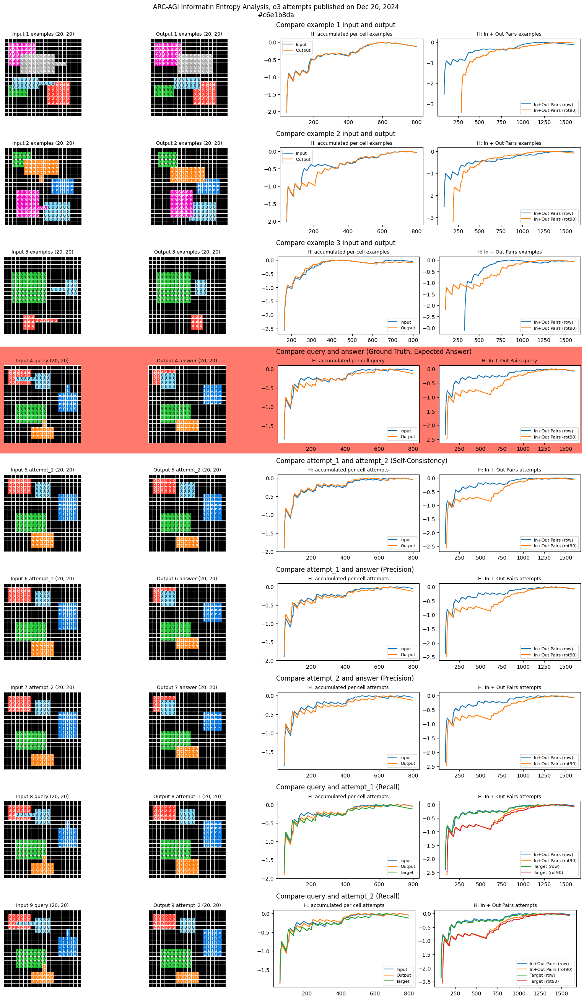

#09c534e7


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

query
3 query
Captured answer [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.17203694935311378, 0.17203694935311378, 0.2863969571159562, 0.2863969571159562, 0.3776463213737003, 0.3776463213737003, 0.4537163391869449, 0.4537163391869449, 0.5185697317883058, 0.5185697317883058, 0.5107878229540133, 0.5107878229540133, 0.5032583347756457, 0.5032583347756457, 0.4959690720618337, 0.4959690720618337, 0.48890859144051524, 0.48890859144051524, 0.48206614808309317, 0.48206614808309317, 0.4754316462687207, 0.4754316462687207, 0.46899559358928117, 0.46899559358928117, 0.4627490585781739, 0.4627490585781739, 0.4566836315394428, 0.4566836315394428, 0.45079138835466503, 

<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
4 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
5 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
6 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
7 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

attempts
8 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

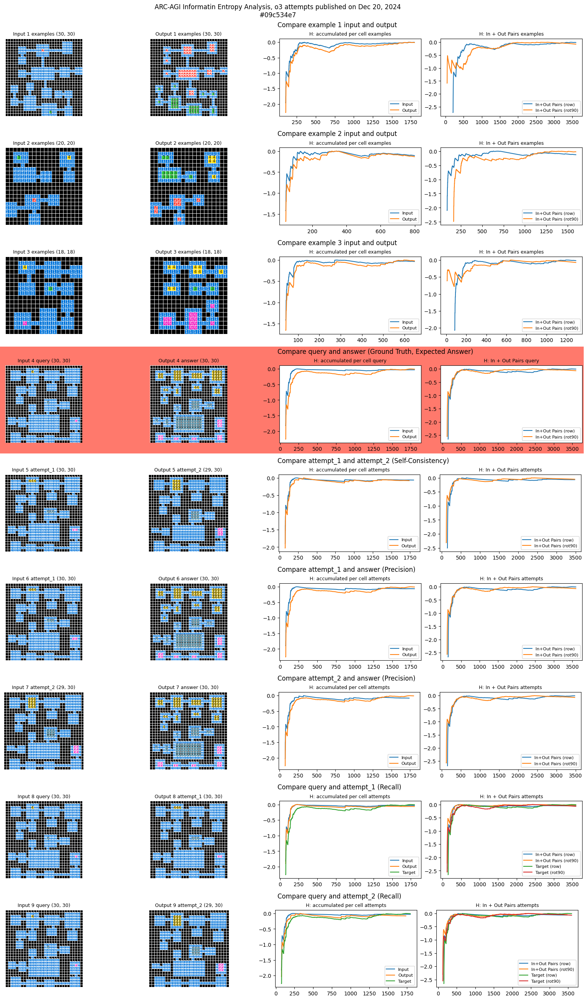

#ac0c5833


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

query
3 query
Captured answer [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.26676498780302604, 0.26676498780302604, 0.42622865699814483, 0.42622865699814483, 0.5435644431995964, 0.5435644431995964, 0.5293608652873644, 0.5293608652873644, 0.5159469300074474, 0.5159469300074474, 0.5032583347756457, 0.5032583347756457, 0.4912373418243331, 0.4912373418243331, 0.4798320236161284, 0.4798320236161284, 0.46899559358928117, 0.46899559358928117, 0.45868581620054033, 0.45868581620054033, 0.4488644887230295, 0.4488644887230295, 0.43949698692151334, 0.43949698692151334, 0.4305518670104394, 0.4305518670104394, 0.42200051688315315, 0.42200051688315315, 0.4138168503036338, 0.4138168503036338, 0.40597703847557115, 0.40597703847557115, 0.3984592740952357, 0.3984592740952357, 0.3912435636292556, 0.3912435636292556, 0.38431154412649704, 0.38

<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
4 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
5 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
6 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
7 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

attempts
8 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

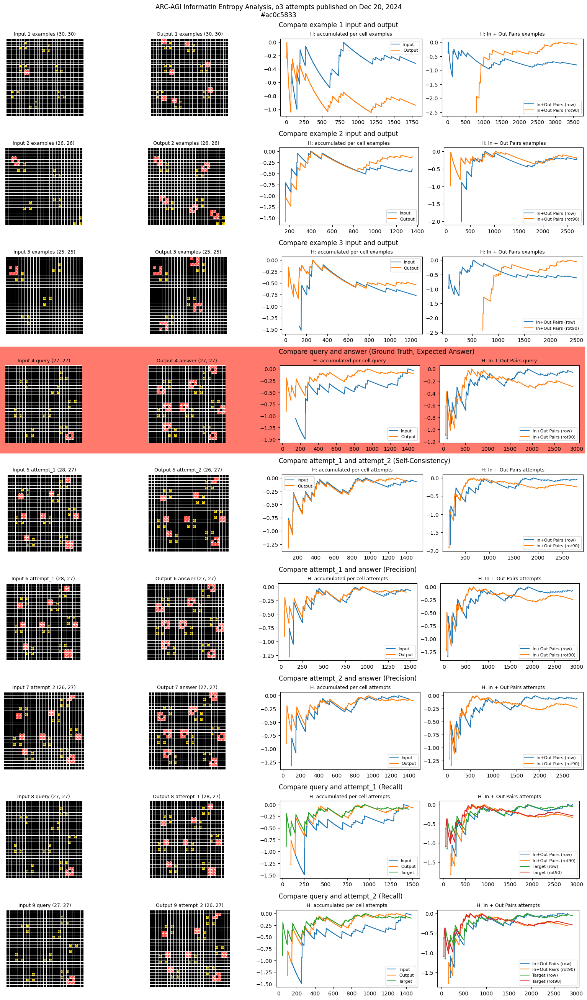

#47996f11


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

query
4 query
Captured answer [0.0, 0.0, 1.0, 1.0, 0.9182958340544894, 0.9182958340544894, 1.5, 1.5, 1.9219280948873625, 1.9219280948873625, 1.9182958340544896, 1.9182958340544896, 1.950212064914747, 1.950212064914747, 1.9056390622295665, 1.9056390622295665, 1.974937501201927, 1.974937501201927, 1.9219280948873625, 1.9219280948873625, 1.9362600275315278, 1.9362600275315278, 2.1887218755408675, 2.1887218755408675, 2.199687794731328, 2.199687794731328, 2.2709424217485368, 2.2709424217485368, 2.2565647621309544, 2.2565647621309544, 2.2272170014624826, 2.2272170014624826, 2.189541517339139, 2.189541517339139, 2.1473487816330517, 2.1473487816330517, 2.1868085945630504, 2.1868085945630504, 2.1464393446710153, 2.1464393446710153, 2.165894208390024, 2.165894208390024, 2.1867043459100244, 2.1867043459100244, 2.192708022385847, 2.192708022385847, 2.1625056054120884, 2.1625056054120884, 2.162292189082415, 2.162292189082415, 2.155023969395552, 2.155023969395552, 2.1700560228367705, 2.1700560228367

<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
5 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
6 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
7 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
8 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

attempts
9 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

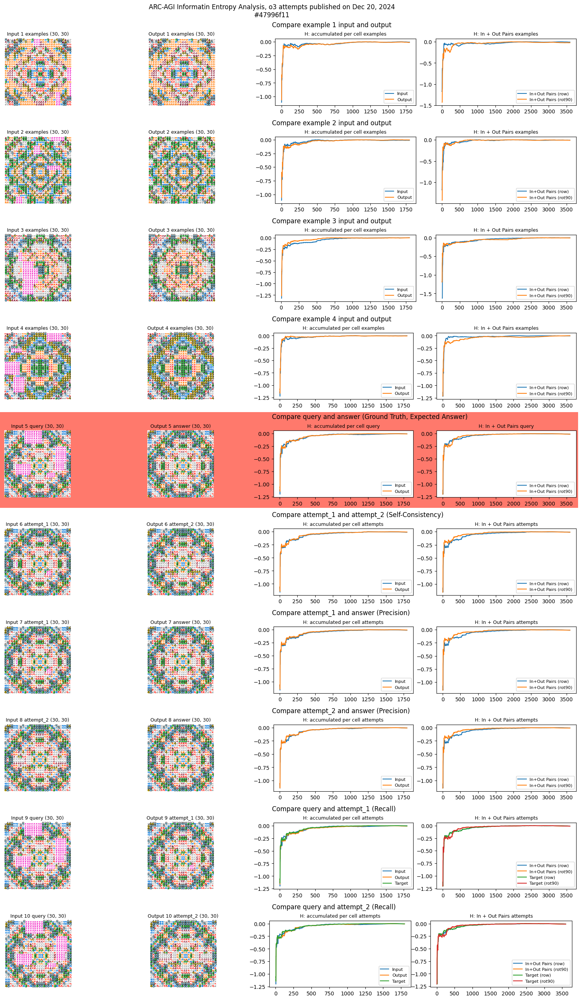

#b457fec5


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

query
3 query
Captured answer [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.21084230031853216, 0.21084230031853216, 0.40963344397721096, 0.40963344397721096, 0.5974547231656379, 0.5974547231656379, 0.7752593054584657, 0.7752593054584657, 0.7578534921839996, 0.7578534921839996, 0.7412805706023057, 0.7412805706023057, 0.7254805569978681, 0.7254805569978681, 0.7103991510660047, 0.7103991510660047, 0.695987076535387, 0.695987076535387, 0.6821995113475348, 0.6821995113475348, 0.6689955935892812, 0.6689955935892812, 0.7693251740833704, 0.7693251740833704, 0.8477415286338386, 0.8477415286338386, 0.9119089395410924, 0.9119089395410924, 0.9656375157654777, 0.9656375157654777, 1.011251428413004, 1.011251428413004, 0.9961804444787937, 0.9961804444787937,

<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
4 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
5 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
6 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
7 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

attempts
8 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

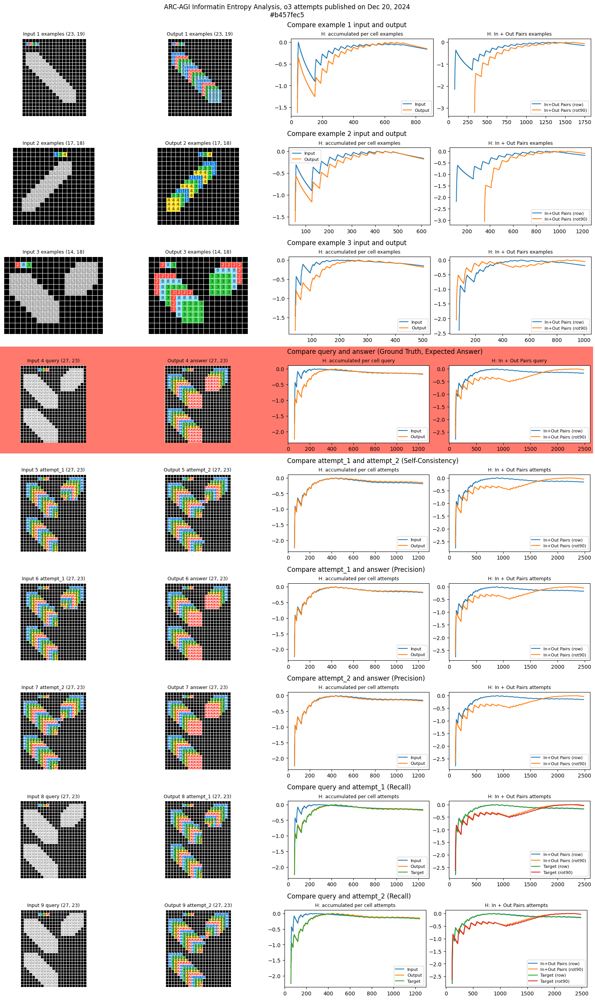

#b7999b51


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

query
3 query
Captured answer [0.0, 0.0, 1.0, 1.0, 1.584962500721156, 1.584962500721156, 2.0, 2.0, 2.3219280948873626, 2.3219280948873626, 2.251629167387823, 2.251629167387823, 2.2359263506290334, 2.2359263506290334, 2.25, 2.25, 2.2810361125534238, 2.2810361125534238, 2.5219280948873624, 2.5219280948873624, 2.481714572986073, 2.481714572986073, 2.459147917027245, 2.459147917027245, 2.449311833026446, 2.449311833026446, 2.502736171594004, 2.502736171594004, 2.5055872616982606, 2.5055872616982606, 2.48345859334435, 2.48345859334435, 2.4692407821722844, 2.4692407821722844, 2.4613201402110088, 2.4613201402110088, 2.439268146254097, 2.439268146254097, 2.408694969562842, 2.408694969562842, 2.3983029951155594, 2.3983029951155594, 2.391979643393478, 2.391979643393478, 2.3659248732117817, 2.3659248732117817, 2.336038815261277, 2.336038815261277, 2.3037164512140085, 2.3037164512140085, 2.3003001799138603, 2.3003001799138603, 2.2699399492078824, 2.2699399492078824, 2.2384959654169796, 2.238495965

<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
4 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
5 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
6 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
7 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

attempts
8 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

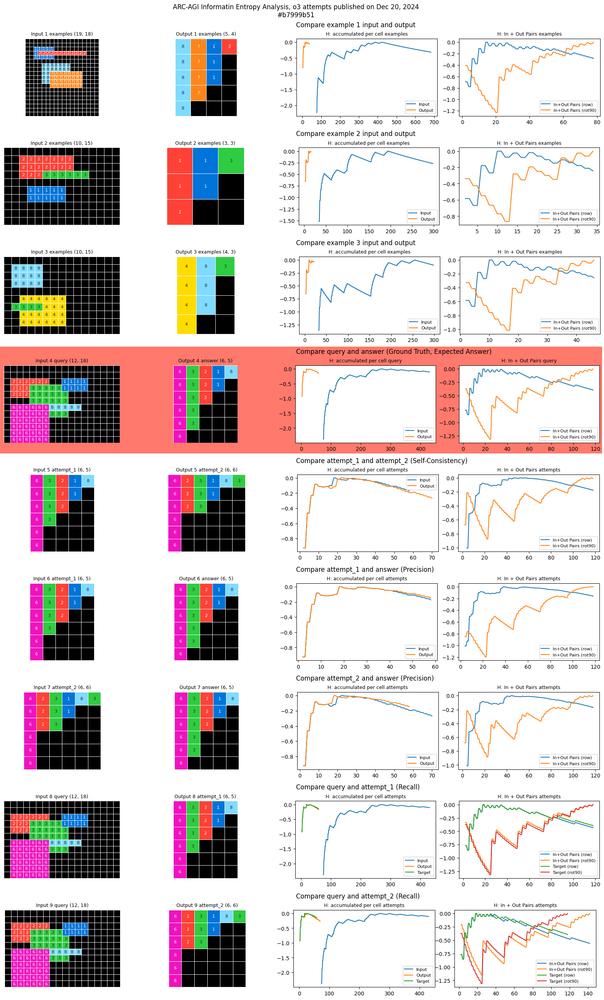

#b9630600


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

query
3 query
Captured answer [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0922772477445739, 0.0922772477445739, 0.15935006268563445, 0.15935006268563445, 0.21639693245126465, 0.21639693245126465, 0.266

<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
4 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
5 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
6 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
7 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

attempts
8 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

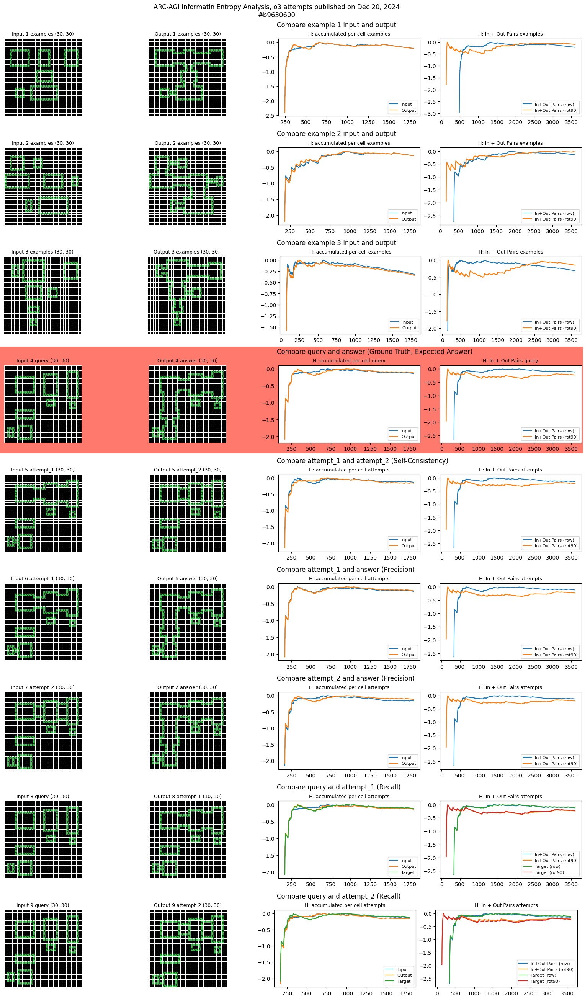

#896d5239


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

query
3 query
Captured answer [0.0, 0.0, 0.0, 0.0, 0.9182958340544894, 0.9182958340544894, 1.0, 1.0, 0.9709505944546688, 0.9709505944546688, 1.0, 1.0, 0.9852281360342515, 0.9852281360342515, 1.0, 1.0, 0.9910760598382222, 0.9910760598382222, 0.9709505944546688, 0.9709505944546688, 0.9456603046006401, 0.9456603046006401, 0.9798687566511527, 0.9798687566511527, 0.961236604722876, 0.961236604722876, 0.940285958670631, 0.940285958670631, 0.9709505944546688, 0.9709505944546688, 0.954434002924965, 0.954434002924965, 0.9774178175281716, 0.9774178175281716, 0.964078764808229, 0.964078764808229, 0.9819407868640977, 0.9819407868640977, 0.9709505944546688, 0.9709505944546688, 0.9852281360342515, 0.9852281360342515, 1.2072100267448116, 1.2072100267448116, 1.2088301752949477, 1.2088301752949477, 1.2069084251518167, 1.2069084251518167, 1.197477624140946, 1.197477624140946, 1.195621781814628, 1.195621781814628, 1.1873868015167897, 1.1873868015167897, 1.1856161633204378, 1.1856161633204378, 1.178357709

<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
4 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
5 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
6 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
7 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

attempts
8 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

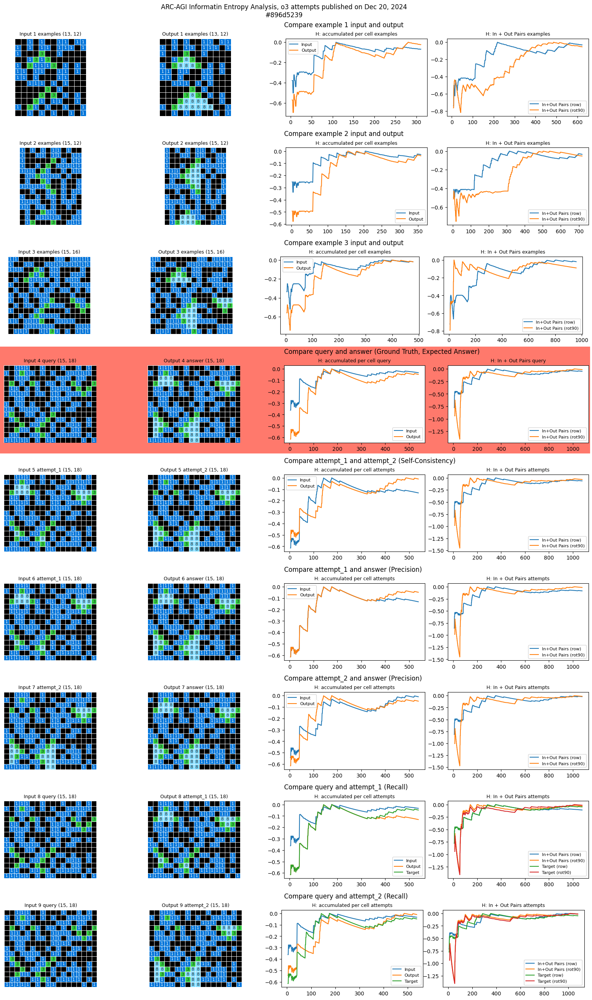

#40f6cd08


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

query
3 query
Captured answer [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.19590927087360493, 0.19590927087360493, 0.3227569588973983, 0.3227569588973983, 0.5007115883735379, 0.5007115883735379, 0.6143694458867569, 0.6143694458867569, 0.7770209331965172, 0.7770209331965172, 0.9321380397593749, 0.9321380397593749, 1.0289919624519919, 1.0289919624519919, 1.1030559073332757, 1.1030559073332757, 1.1927986509067794, 1.1927986509067794, 1.2611323036281192, 1.2611323036281192, 1.3156859755820172, 1.3156859755820172, 1.379664004902594, 1.379664004902594, 1.4306333740593755, 1.4306333740593755, 1.4100860116876124, 1.4100860116876124, 1.390150040939871, 1.390150040939871, 1.3708001445703795, 1.3708001445703795, 1.352012138

<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
4 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
5 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
6 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
7 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

attempts
8 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

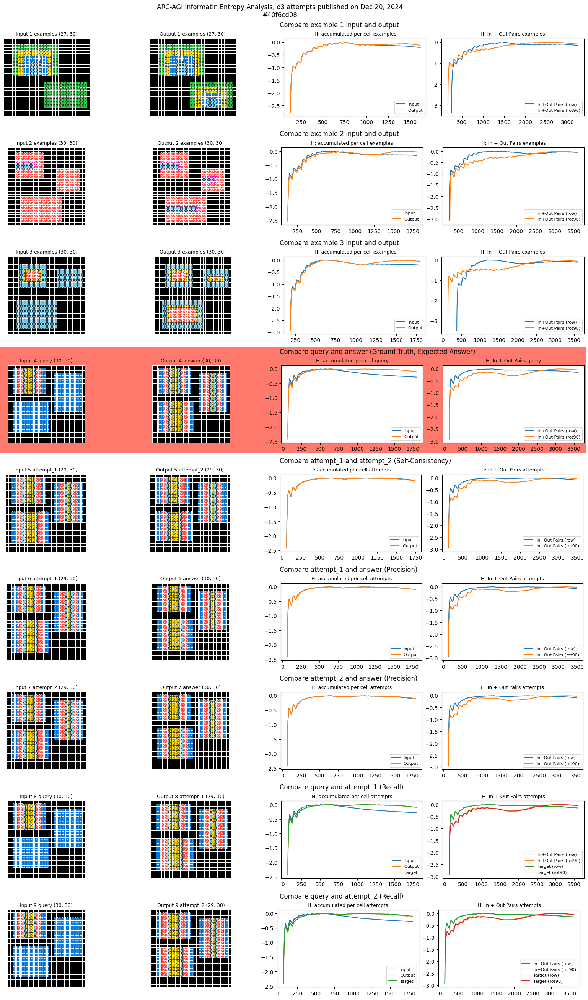

#8b28cd80


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

query
6 query
Captured answer [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.46899559358928117, 0.46899559358928117, 0.6840384356390417, 0.6840384356390417, 0.8112781244591328, 0.8112781244591328, 0.8904916402194913, 0.8904916402194913, 0.940285958670631, 0.940285958670631, 0.9709505944546688, 0.9709505944546688, 0.9886994082884974, 0.9886994082884974, 0.9975025463691153, 0.9975025463691153, 0.9910760598382222, 0.9910760598382222, 0.9819407868640977, 0.9819407868640977, 0.9709505944546688, 0.9709505944546688, 0.9587118829771317, 0.9587118829771317, 0.9456603046006401, 0.9456603046006401, 0.9321115676166747, 0.9321115676166747, 0.9182958340544894, 0.9182958340544894, 0.9043814577244939, 0.9043814577244939, 0.930586129131993, 0.930586129131993, 0.9182958340544894, 0.9182958340544894, 0.940285958670631, 0.940285958670631, 0.9575534837147484, 0.9575534837147484, 0.9709505944546688, 0.9709505944546688, 0.9811522341999134, 0.9811522341999134, 0.9

<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

attempts
8 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
9 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
10 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

attempts
11 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

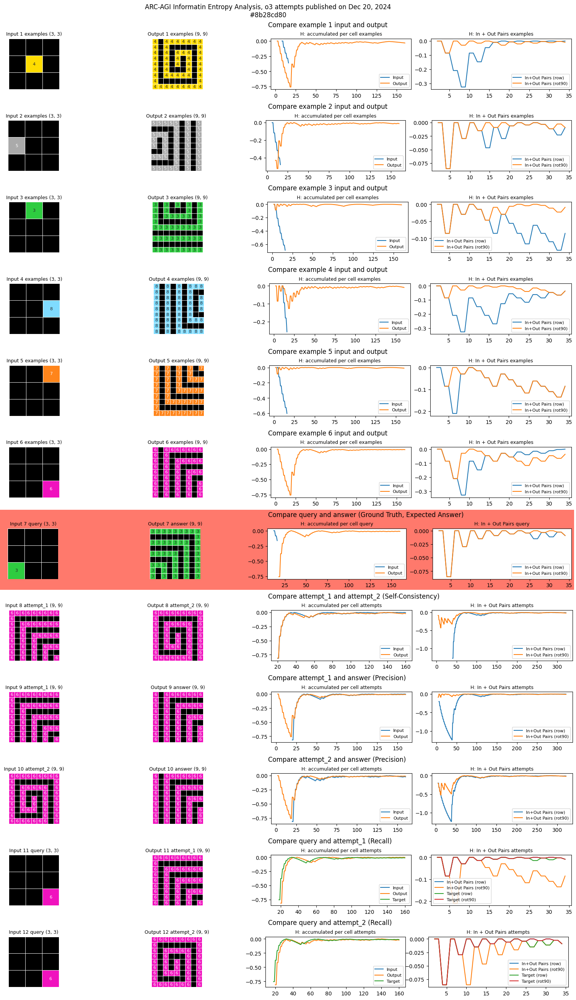

#93c31fbe


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

query
3 query
Captured answer [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.20559250818508307, 0.20559250818508307, 0.3372900666170139, 0.3372900666170139, 0.32984607020714635, 0.32984607020714635, 0.3227569588973983, 0.3227569588973983, 0.42200051688315315, 0.42200051688315315, 0.5032583347756457, 0.5032583347756457, 0.4941829348497886, 0.4941829348497886, 0.4854607607459134, 0.4854607607459134, 0.4770713062193297, 0.4770713062193297, 0.46899559358928117, 0.46899559358928117, 0.4612160405139095, 0.4612160405139095, 0.4537163391869449, 0.4537163391869449, 0.446481346896803, 0.446481346896803, 0.43949698692151334, 0.43949698692151334, 0.43275015878875406, 0.43275015878875406, 0.42622865699814483, 0.42622865699814483, 0.419921097375718

<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
4 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
5 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
6 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
7 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

attempts
8 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

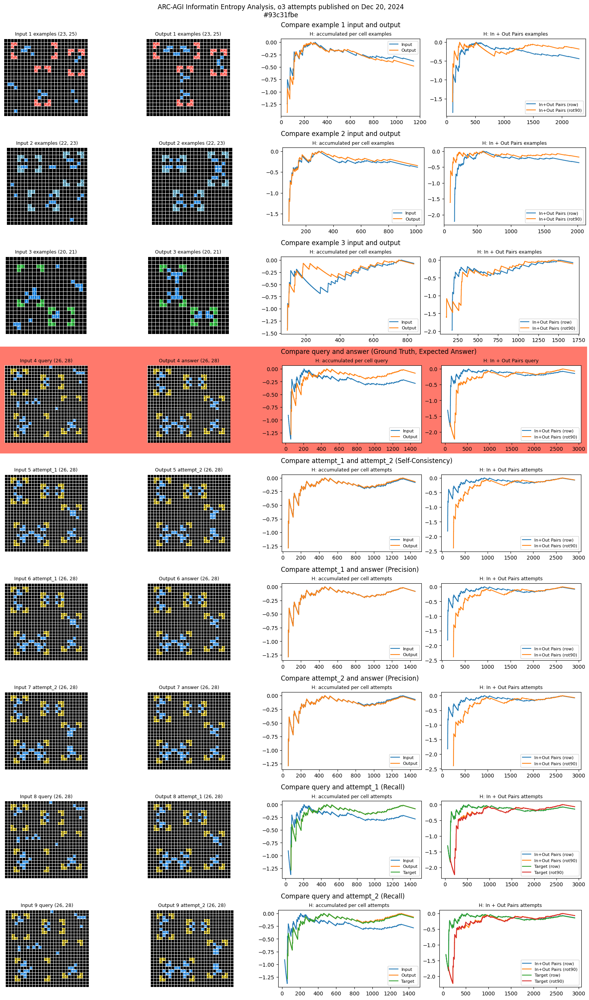

#25094a63


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

query
2 query
Captured answer [0.0, 0.0, 1.0, 1.0, 1.584962500721156, 1.584962500721156, 1.5, 1.5, 1.370950594454669, 1.370950594454669, 1.459147917027245, 1.459147917027245, 1.8423709931771086, 1.8423709931771086, 1.8112781244591327, 1.8112781244591327, 1.7527152789797047, 1.7527152789797047, 1.7219280948873625, 1.7219280948873625, 1.6767370300521327, 1.6767370300521327, 1.784159127851422, 1.784159127851422, 1.884313527799799, 1.884313527799799, 1.8631205685666308, 1.8631205685666308, 1.9086126988727126, 1.9086126988727126, 2.1266144718101816, 2.1266144718101816, 2.0948567835487384, 2.0948567835487384, 2.107735252622104, 2.107735252622104, 2.104292989590925, 2.104292989590925, 2.090468570732828, 2.090468570732828, 2.0698936164374757, 2.0698936164374757, 2.0543130103080576, 2.0543130103080576, 2.136057200263827, 2.136057200263827, 2.1821501304958755, 2.1821501304958755, 2.226960814271916, 2.226960814271916, 2.2264966828541564, 2.2264966828541564, 2.2523826349302514, 2.2523826349302514,

<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
3 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
4 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
5 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
6 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

attempts
7 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

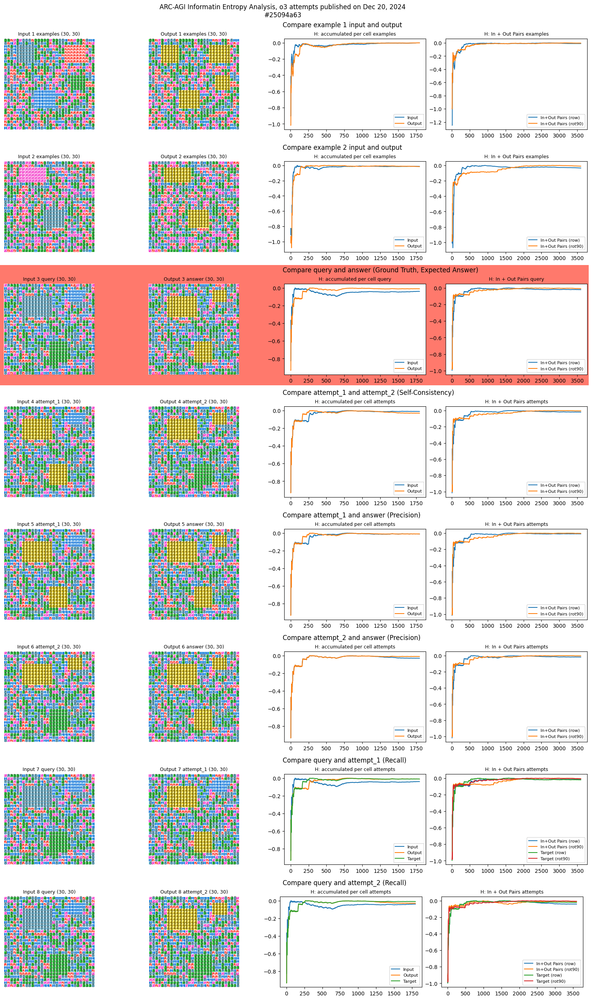

#05a7bcf2


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

query
3 query
Captured answer [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.43949698692151334, 0.43949698692151334, 0.4138168503036338, 0.4138168503036338, 0.3912435636292556, 0.3912435636292556, 0.3712323266408757, 0.3712323266408757, 0.3533593350214213, 0.3533593350214213, 0.3372900666170139, 0.3372900666170139, 0.3227569588973983, 0.3227569588973983, 0.3095434291503252, 0.3095434291503252, 0.2974722489192897, 0.2974722489192897, 0.5689955935892812, 0.5689955935892812, 0.5489544344250401, 0.5489544344250401, 0.5304060778306042, 0.5304060778306042, 0.5131851787372752, 0.5131851787372752, 0.49715018363696695, 0.49715018363696695, 0.48217919020227273, 0.48217919020227273, 0.46816664055233254, 0.46816664055233254, 0.45502065977946415, 0.45502065977946415, 0.442660898069447, 0.442660898069447, 0.4310167689753773, 0.4310167689753773, 0.420026001688088, 0.420026001688088, 0.5475531549800071, 0.5475531549800071, 0.6449742087569881, 0.6

<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
4 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
5 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
6 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
7 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

attempts
8 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

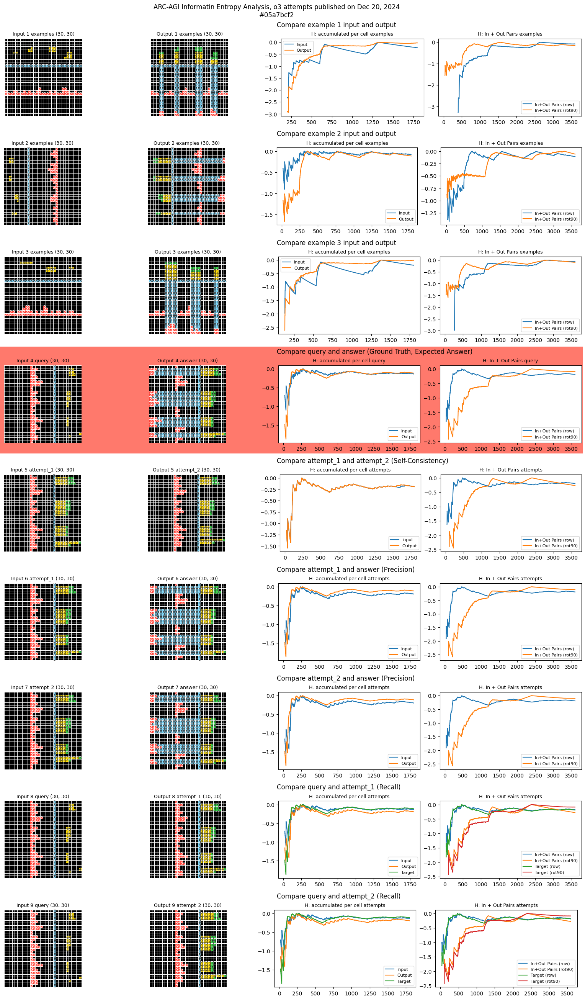

#0934a4d8


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

query
4 query
Captured answer [0.0, 0.0, 0.0, 0.0, 0.9182958340544894, 0.9182958340544894, 0.8112781244591328, 0.8112781244591328, 1.370950594454669, 1.370950594454669, 1.459147917027245, 1.459147917027245, 1.3787834934861756, 1.3787834934861756, 1.5, 1.5, 1.5304930567574826, 1.5304930567574826, 1.4854752972273346, 1.4854752972273346, 1.4353713907745334, 1.4353713907745334, 1.459147917027245, 1.459147917027245, 1.7381493331928664, 1.7381493331928664, 1.8423709931771088, 1.8423709931771088, 1.7967916319816368, 1.7967916319816368, 1.8496017527145816, 1.8496017527145816, 1.8726696380501493, 1.8726696380501493, 1.836591668108979, 1.836591668108979, 2.0374011976541118, 2.0374011976541118, 2.121928094887362, 2.121928094887362, 2.297079327540665, 2.297079327540665, 2.334209459448049, 2.334209459448049, 2.3496489125787523, 2.3496489125787523, 2.351227480952956, 2.351227480952956, 2.4194705707972526, 2.4194705707972526, 2.411602217974672, 2.411602217974672, 2.448788890811972] 4


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
5 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
6 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
7 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
8 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

attempts
9 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

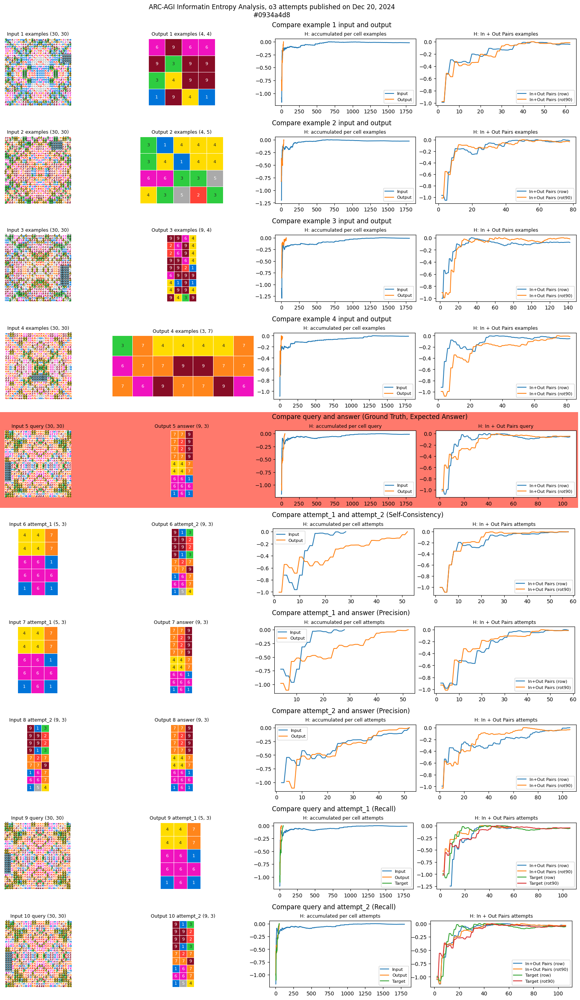

#79fb03f4


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

query
6 query
Captured answer [0.0, 0.0, 0.0, 0.0, 0.9182958340544894, 0.9182958340544894, 0.8112781244591328, 0.8112781244591328, 0.7219280948873623, 0.7219280948873623, 0.6500224216483541, 0.6500224216483541, 0.5916727785823274, 0.5916727785823274, 0.5435644431995964, 0.5435644431995964, 0.5032583347756457, 0.5032583347756457, 0.46899559358928117, 0.46899559358928117, 0.6840384356390417, 0.6840384356390417, 0.6500224216483541, 0.6500224216483541, 0.6193821946787638, 0.6193821946787638, 0.5916727785823274, 0.5916727785823274, 0.5665095065529053, 0.5665095065529053, 0.5435644431995964, 0.5435644431995964, 0.5225593745369408, 0.5225593745369408, 0.5032583347756457, 0.5032583347756457, 0.4854607607459134, 0.4854607607459134, 0.46899559358928117, 0.46899559358928117, 0.5916727785823274, 0.5916727785823274, 0.5746356978376794, 0.5746356978376794, 0.5586293734521992, 0.5586293734521992, 0.5435644431995964, 0.5435644431995964, 0.5293608652873644, 0.5293608652873644, 0.5159469300074474, 0.515

<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
7 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
8 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
9 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
10 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
11 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

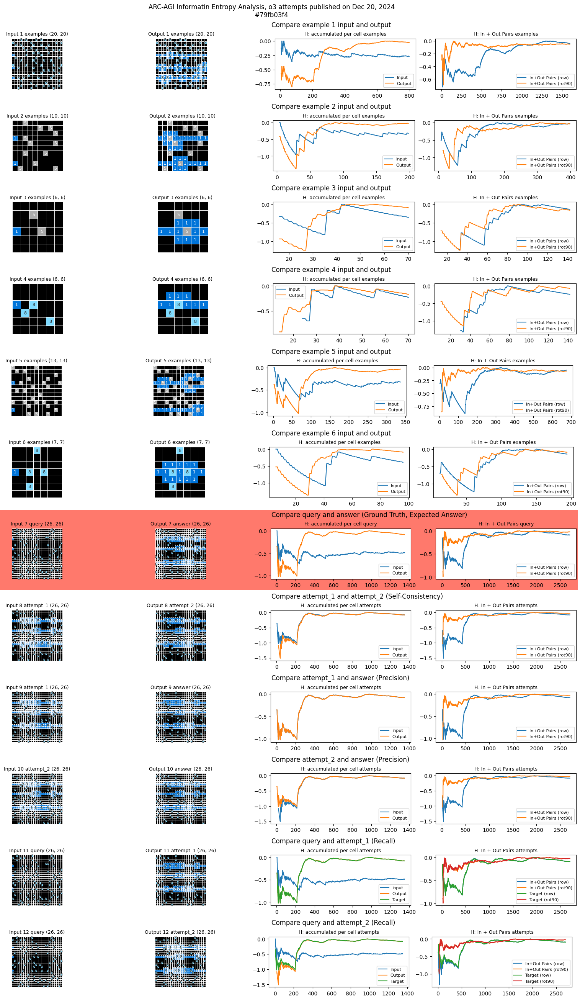

#4b6b68e5


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

query
3 query
Captured answer [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.22228483068568797, 0.22228483068568797, 0.36205125173399794, 0.36205125173399794, 0.46899559358928117, 0.46899559358928117, 0.5547781633412736, 0.5547781633412736, 0.6252624052234231, 0.6252624052234231, 0.6840384356390417, 0.6840384356390417, 0.7335379291086666, 0.7335379291086666, 0.7219280948873623, 0.7219280948873623, 0.7106768538561229, 0.7106768538561229, 0.6997722217733069, 0.6997722217733069, 0.6892019851173655, 0.6892019851173655, 0.6789538995185759, 0.6789538995185759, 0.6690158350565576, 0.6690158350565576, 0.818125409661201, 0.818125409661201, 0.9133533657970414, 0.9133533657970414, 0.9873955013208037, 0.9873955013208037, 1.047693200609293, 1.047693200609293, 1.097939077048141

<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
4 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
5 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
6 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
7 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

attempts
8 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

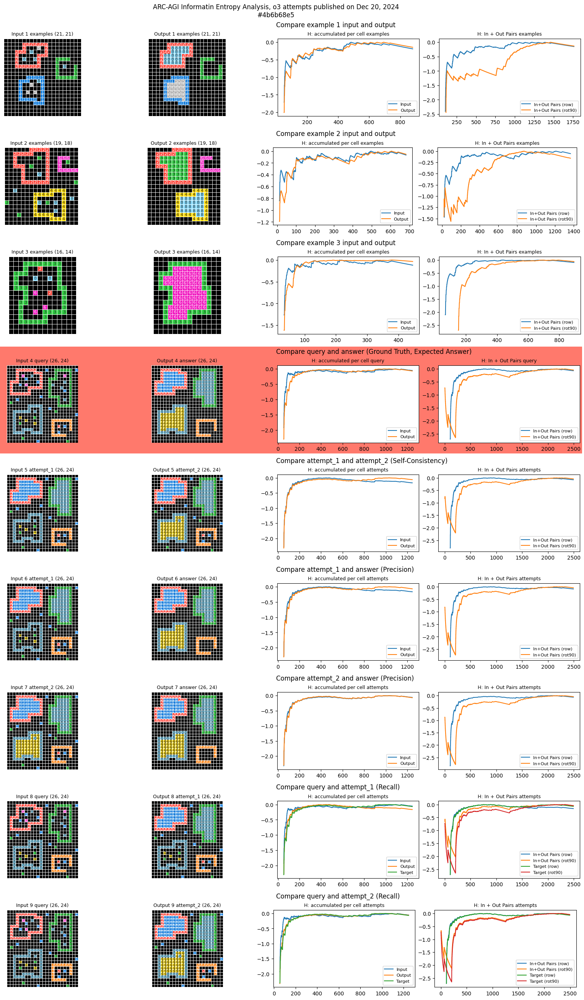

#aa4ec2a5


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zer

query
3 query
Captured answer [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.18717625687320819, 0.18717625687320819, 0.3095434291503252, 0.3095434291503252, 0.40597703847557115, 0.40597703847557115, 0.4854607607459134, 0.4854607607459134, 0.5524951143251111, 0.5524951143251111, 0.6098403047164005, 0.6098403047164005, 0.6593758812786993, 0.6593758812786993, 0.7024665512903904, 0.7024665512903904, 0.7401470427139037, 0.7401470427139037, 0.7732266742876345, 0.7732266742876345, 0.80235344282919, 0.80235344282919, 0.7935912300117064, 0.7935912300117064, 0.7849920887641583, 0.7849920887641583, 0.7765557854444601, 0.7765557854444601, 0.7682814090975241, 0.7682814090975241, 0.7601675029619656, 0.7601675

<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
4 attempts


<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]
<ipython-input-8-75648d6797e4>:10: RuntimeWarning: divide by zero encountered in log
  return [np.log((x - min_val) / (max_val - min_val)) for x in values]


attempts
5 attempts


In [ ]:
for a in { k : v for (k,v) in results['task_results'].items() if v==0}.keys():
  show_arc(a, c='train')